In [1]:

from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint
import joblib


In [2]:
import warnings
warnings.filterwarnings(action='ignore')
import os
from tqdm import tqdm

import pandas as pd
import itertools
import folium
from pyproj import Transformer, transform
import time
import numpy as np
import matplotlib.pyplot as plt
from math import radians, cos, sin, asin, sqrt

from collections import deque
import powerlaw

In [3]:
def get_centermost_point(cluster):
    centroid = (MultiPoint(cluster).centroid.x, MultiPoint(cluster).centroid.y)
    centermost_point = min(cluster, key=lambda point: great_circle(point, centroid).m)
    return tuple(centermost_point)


In [4]:
def isBoundary(x):
      return x<n1*n2 and x>=0
def sea(n1,n2,a,df):
    n1 = int(n1)
    n2= int(n2)
    if df2['idx'].iloc[a][1]==0:
        return list(filter(isBoundary, [a+1,a+n1,a+n1+1,a-n1,a-n1+1]))
    if df2['idx'].iloc[a][1]==n1-1:
        return list(filter(isBoundary, [a-1,a+n1,a+n1-1,a-n1,a-n1-1]))

    return list(filter(isBoundary, [a+1,a-1,a+n1,a+n1-1,a+n1+1,a-n1,a-n1-1,a-n1+1]))


In [5]:
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371.0088 # Radius of earth in kilometers. Use 3956 for miles. Determines return value units.
    return c * r

In [35]:
forders= os.listdir('./LA/')
forders

['LA_JUMP_Biketrip_2020-01(4hour_0).csv',
 'LA_JUMP_Biketrip_2020-02(4hour_0).csv',
 'LA_JUMP_Biketrip_2019-12(4hour_0).csv']

In [36]:
station_raw = pd.DataFrame()
for files in forders:
    print(files)
    df= pd.read_csv('./LA/'+files,encoding='utf-8')
    station_raw = pd.concat([station_raw, df])

LA_JUMP_Biketrip_2020-01(4hour_0).csv
LA_JUMP_Biketrip_2020-02(4hour_0).csv
LA_JUMP_Biketrip_2019-12(4hour_0).csv


In [37]:
station_raw

,Unnamed: 0,bike_id,start_time,start_lat,start_lon,start_soc,end_time,end_lat,end_lon,end_soc,duration_second,start_e_level,end_e_level,battery_cosmp
0,0,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 00:01:08,34.007213,-118.492552,72%,2020-01-01 00:02:08,34.007197,-118.492550,72%,60.0,72,72,0
1,1,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 00:11:08,34.007197,-118.492550,72%,2020-01-01 00:12:09,34.007207,-118.492552,72%,61.0,72,72,0
2,2,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 00:21:08,34.007207,-118.492552,72%,2020-01-01 00:22:07,34.007215,-118.492555,72%,59.0,72,72,0
3,3,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 00:31:08,34.007215,-118.492555,72%,2020-01-01 00:32:07,34.007192,-118.492555,72%,59.0,72,72,0
4,4,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 00:41:07,34.007192,-118.492555,72%,2020-01-01 00:42:08,34.007182,-118.492555,72%,61.0,72,72,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4792689,4822123,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-30 08:21:08,34.019697,-118.497480,29%,2019-12-30 08:22:07,34.019573,-118.497420,29%,59.0,29,29,0
4792690,4822124,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-30 08:31:08,34.019573,-118.497420,29%,2019-12-30 08:32:08,34.019458,-118.497422,29%,60.0,29,29,0
4792691,4822125,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-30 08:41:07,34.019458,-118.497422,29%,2019-12-30 08:42:07,34.019537,-118.497422,29%,60.0,29,29,0
4792692,4822126,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-30 08:49:07,34.019537,-118.497422,29%,2019-12-30 08:50:07,34.019507,-118.497485,29%,60.0,29,29,0


station_raw = pd.read_csv('./LA/LA_JUMP_Biketrip_2019-12(4hour_0).csv')
k=[]
'''
for i in range(0,301740):
    k.append(time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(station_raw.iloc[i]['time_stamp_ori']))) 
station_raw['time_stamp_ori']=k
'''
station_raw

In [38]:
station_raw=station_raw[station_raw.start_lat>33]
station_raw=station_raw[station_raw.end_lat>33]
station_raw=station_raw[station_raw.end_lat<34.5]
station_raw=station_raw[station_raw.start_lat<34.5]
station_raw=station_raw[station_raw.end_lon>-119]
station_raw=station_raw[station_raw.end_lon>-119]

station_raw=station_raw[station_raw.end_lon<-115]
station_raw=station_raw[station_raw.start_lon<-115]
station_raw = station_raw[station_raw.start_lon!=station_raw.end_lon]
station_raw = station_raw[station_raw.start_lon!=station_raw.end_lon]
station_raw = station_raw[station_raw.start_lat!=station_raw.end_lat]
station_raw = station_raw[station_raw.battery_cosmp !=0]


station_raw

,Unnamed: 0,bike_id,start_time,start_lat,start_lon,start_soc,end_time,end_lat,end_lon,end_soc,duration_second,start_e_level,end_e_level,battery_cosmp
20,20,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 03:21:08,34.007128,-118.492517,72%,2020-01-01 03:22:07,34.007138,-118.492500,71%,59.0,72,71,1
47,47,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 08:01:07,34.007127,-118.492530,71%,2020-01-01 08:02:07,34.007240,-118.492640,70%,60.0,71,70,1
68,68,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 11:15:08,34.007142,-118.492563,70%,2020-01-01 11:48:07,33.979312,-118.467185,66%,1979.0,70,66,4
84,84,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 14:16:07,33.979333,-118.467193,66%,2020-01-01 14:17:07,33.979315,-118.467277,65%,60.0,66,65,1
108,108,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 17:56:07,33.979143,-118.467492,65%,2020-01-01 17:57:07,33.979100,-118.467473,64%,60.0,65,64,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4792589,4822023,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-29 15:41:07,34.035865,-118.493577,36%,2019-12-29 15:42:07,34.035815,-118.493592,35%,60.0,36,35,1
4792615,4822049,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-29 20:01:07,34.035758,-118.493608,35%,2019-12-29 20:02:07,34.035843,-118.493510,34%,60.0,35,34,1
4792639,4822073,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-29 23:46:08,34.035760,-118.493620,34%,2019-12-30 00:07:07,34.019495,-118.497457,31%,1259.0,34,31,3
4792657,4822091,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-30 03:01:08,34.019423,-118.497433,31%,2019-12-30 03:02:08,34.019453,-118.497418,30%,60.0,31,30,1


In [39]:
station_raw['start_time'].min(),station_raw['end_time'].max()
station_raw = station_raw.rename(columns={'start_lat':'lat','start_lon':'lon'})
station_raw

,Unnamed: 0,bike_id,start_time,lat,lon,start_soc,end_time,end_lat,end_lon,end_soc,duration_second,start_e_level,end_e_level,battery_cosmp
20,20,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 03:21:08,34.007128,-118.492517,72%,2020-01-01 03:22:07,34.007138,-118.492500,71%,59.0,72,71,1
47,47,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 08:01:07,34.007127,-118.492530,71%,2020-01-01 08:02:07,34.007240,-118.492640,70%,60.0,71,70,1
68,68,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 11:15:08,34.007142,-118.492563,70%,2020-01-01 11:48:07,33.979312,-118.467185,66%,1979.0,70,66,4
84,84,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 14:16:07,33.979333,-118.467193,66%,2020-01-01 14:17:07,33.979315,-118.467277,65%,60.0,66,65,1
108,108,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 17:56:07,33.979143,-118.467492,65%,2020-01-01 17:57:07,33.979100,-118.467473,64%,60.0,65,64,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4792589,4822023,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-29 15:41:07,34.035865,-118.493577,36%,2019-12-29 15:42:07,34.035815,-118.493592,35%,60.0,36,35,1
4792615,4822049,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-29 20:01:07,34.035758,-118.493608,35%,2019-12-29 20:02:07,34.035843,-118.493510,34%,60.0,35,34,1
4792639,4822073,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-29 23:46:08,34.035760,-118.493620,34%,2019-12-30 00:07:07,34.019495,-118.497457,31%,1259.0,34,31,3
4792657,4822091,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-30 03:01:08,34.019423,-118.497433,31%,2019-12-30 03:02:08,34.019453,-118.497418,30%,60.0,31,30,1


KeyError: "['Unnamed: 0', 'bike_id', 'start_time'] not found in axis"

In [54]:
query_day=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31]
query_day2=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
df1= station_raw

df1['start_time'] = pd.to_datetime(df1['start_time'])
for day in query_day:
    globals()['dfd{}'.format(day)]=  df1.query('start_time.dt.day == @day and start_time.dt.month==12')
    globals()['df1{}1'.format(day)] = globals()['dfd{}'.format(day)].query('start_time.dt.hour <= 7 and start_time.dt.hour>=0')
    globals()['df1{}2'.format(day)] = globals()['dfd{}'.format(day)].query('start_time.dt.hour <= 15 and start_time.dt.hour>=8')
    globals()['df1{}3'.format(day)] = globals()['dfd{}'.format(day)].query('start_time.dt.hour <= 23 and start_time.dt.hour>=16')
    globals()['df1{}1'.format(day)].reset_index(drop=True, inplace=True)
    globals()['df1{}2'.format(day)].reset_index(drop=True, inplace=True)
    globals()['df1{}3'.format(day)].reset_index(drop=True, inplace=True)
    globals()['dfj{}'.format(day)]=  df1.query('start_time.dt.day == @day and start_time.dt.month==1')
    globals()['df2{}1'.format(day)] = globals()['dfj{}'.format(day)].query('start_time.dt.hour <= 7 and start_time.dt.hour>=0')
    globals()['df2{}2'.format(day)] = globals()['dfj{}'.format(day)].query('start_time.dt.hour <= 15 and start_time.dt.hour>=8')
    globals()['df2{}3'.format(day)] = globals()['dfj{}'.format(day)].query('start_time.dt.hour <= 23 and start_time.dt.hour>=16')
    globals()['df2{}1'.format(day)].reset_index(drop=True, inplace=True)
    globals()['df2{}2'.format(day)].reset_index(drop=True, inplace=True)
    globals()['df2{}3'.format(day)].reset_index(drop=True, inplace=True)
    globals()['dd1{}1'.format(day)]=globals()['df1{}1'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   
    globals()['dd1{}2'.format(day)]=globals()['df1{}2'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   
    globals()['dd1{}3'.format(day)]=globals()['df1{}3'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   
    globals()['dd2{}1'.format(day)]=globals()['df2{}1'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   
    globals()['dd2{}2'.format(day)]=globals()['df2{}2'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   
    globals()['dd2{}3'.format(day)]=globals()['df2{}3'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   

    globals()['df1{}1'.format(day)]=globals()['df1{}1'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_lat','end_lon','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   
    globals()['df1{}2'.format(day)]=globals()['df1{}2'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_lat','end_lon','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   
    globals()['df1{}3'.format(day)]=globals()['df1{}3'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_lat','end_lon','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   
    globals()['df2{}1'.format(day)]=globals()['df2{}1'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_lat','end_lon','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   
    globals()['df2{}2'.format(day)]=globals()['df2{}2'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_lat','end_lon','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   
    globals()['df2{}3'.format(day)]=globals()['df2{}3'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_lat','end_lon','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   

    
for day in query_day2:
    globals()['dff{}'.format(day)]=  df1.query('start_time.dt.day == @day and start_time.dt.month==2')
    globals()['df3{}1'.format(day)] = globals()['dff{}'.format(day)].query('start_time.dt.hour <= 7 and start_time.dt.hour>=0')
    globals()['df3{}2'.format(day)] = globals()['dff{}'.format(day)].query('start_time.dt.hour <= 15 and start_time.dt.hour>=8')
    globals()['df3{}3'.format(day)] = globals()['dff{}'.format(day)].query('start_time.dt.hour <= 23 and start_time.dt.hour>=16')
    globals()['df3{}1'.format(day)].reset_index(drop=True, inplace=True)
    globals()['df3{}2'.format(day)].reset_index(drop=True, inplace=True)
    globals()['df3{}3'.format(day)].reset_index(drop=True, inplace=True)
    globals()['dd3{}1'.format(day)]=globals()['df3{}1'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   
    globals()['dd3{}2'.format(day)]=globals()['df3{}2'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)    
    globals()['dd3{}3'.format(day)]=globals()['df3{}3'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)  

    globals()['df3{}1'.format(day)]=globals()['df3{}1'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_lat','end_lon','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)   
    globals()['df3{}2'.format(day)]=globals()['df3{}2'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_lat','end_lon','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)    
    globals()['df3{}3'.format(day)]=globals()['df3{}3'.format(day)].drop(['Unnamed: 0','bike_id','start_time','start_soc','end_time','end_lat','end_lon','end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)  



In [ ]:
station_raw=station_raw.drop(['Unnamed: 0','bike_id','start_time'],axis=1)
station_raw=station_raw.drop(['start_soc','end_time','end_lat','end_lon'],axis=1)
station_raw=station_raw.drop(['end_soc','duration_second','start_e_level','end_e_level','battery_cosmp'],axis=1)
station_raw = station_raw.rename(columns={'start_lat':'lat','start_lon':'lon'})
station_raw

In [28]:
days1=[]
for i in range(1,32):
    for j in [1,2,3]:
        days1.append(int(str(1)+str(i)+str(j)))
days2=[]
for i in range(1,15):
    for j in [1,2,3]:
        days2.append(int(str(2)+str(i)+str(j)))


days=[]   
for i in range(1,20):

    for j in [1,2,3]:
        days.append(int(str(3)+str(i)+str(j)))

days=days1+days2+days
days

[111,
 112,
 113,
 121,
 122,
 123,
 131,
 132,
 133,
 141,
 142,
 143,
 151,
 152,
 153,
 161,
 162,
 163,
 171,
 172,
 173,
 181,
 182,
 183,
 191,
 192,
 193,
 1101,
 1102,
 1103,
 1111,
 1112,
 1113,
 1121,
 1122,
 1123,
 1131,
 1132,
 1133,
 1141,
 1142,
 1143,
 1151,
 1152,
 1153,
 1161,
 1162,
 1163,
 1171,
 1172,
 1173,
 1181,
 1182,
 1183,
 1191,
 1192,
 1193,
 1201,
 1202,
 1203,
 1211,
 1212,
 1213,
 1221,
 1222,
 1223,
 1231,
 1232,
 1233,
 1241,
 1242,
 1243,
 1251,
 1252,
 1253,
 1261,
 1262,
 1263,
 1271,
 1272,
 1273,
 1281,
 1282,
 1283,
 1291,
 1292,
 1293,
 1301,
 1302,
 1303,
 1311,
 1312,
 1313,
 211,
 212,
 213,
 221,
 222,
 223,
 231,
 232,
 233,
 241,
 242,
 243,
 251,
 252,
 253,
 261,
 262,
 263,
 271,
 272,
 273,
 281,
 282,
 283,
 291,
 292,
 293,
 2101,
 2102,
 2103,
 2111,
 2112,
 2113,
 2121,
 2122,
 2123,
 2131,
 2132,
 2133,
 2141,
 2142,
 2143,
 311,
 312,
 313,
 321,
 322,
 323,
 331,
 332,
 333,
 341,
 342,
 343,
 351,
 352,
 353,
 361,
 362,
 363,
 

In [46]:
for i in days:
    print(len(globals()['df{}'.format(i)]))

1760
2689
2119
1699
2721
2212
1810
2722
2292
1957
2194
2146
1605
2718
2255
1761
2451
2331
1900
2620
2399
2006
2676
2265
1807
3021
2536
1762
2893
2024
1831
2754
2318
1622
2595
2275
1566
2594
2038
1771
2529
2248
1623
2430
2010
1572
2572
2202
1583
2593
2112
1537
2441
1906
1624
2549
1937
1608
2444
2084
1477
2281
1983
1590
2272
1805
1425
2208
1632
1346
1926
1603
1287
1764
1457
1340
1847
1641
1390
2127
1837
1487
2360
2042
1616
2296
2006
1628
2300
2006
1662
2680
2113
1633
2193
1812
1426
2166
1809
1443
2295
2043
1493
2296
1961
1410
2284
1865
1450
2374
1982
1518
2289
2017
1515
2362
1941
1619
2364
1999
1542
2470
2256
1608
2565
2101
1602
2612
1960
1637
2520
2110
1602
936
0
0
0
0
0
0
0
0
904
1072
849
1280
1006
726
933
855
681
1025
875
637
1025
926
603
1042
838
613
822
720
659
1019
858
677
1027
879
683
1019
850
652
1016
808
607
952
824
603
1042
799
584
1042
786
549
897
718
556
869
784
490
830
719


In [27]:
kms_per_radian = 6371.0088
epsilon = 0.1/kms_per_radian
min_sample = 2
print("radian of earth is ", kms_per_radian, " eps is ", epsilon, " min_samples are ", min_sample )

radian of earth is  6371.0088  eps is  1.5696101377226163e-05  min_samples are  2


In [55]:
for index in tqdm(days):
    if len( globals()['df{}'.format(index)])==0:
        print(index)
        continue
    coords = globals()['df{}'.format(index)].to_numpy()
    globals()['db{}'.format(index)] = DBSCAN(eps = epsilon , min_samples = min_sample , algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
    start_time = time.time()
    cluster_labels = globals()['db{}'.format(index)].labels_


    # get the number of clusters
    num_clusters = len(set(cluster_labels))

    # all done, print the outcome
    message = 'Clustered {:,} points down to {:,} clusters, for {:.1f}% compression in {:,.2f} seconds'
    print(message.format(len(globals()['df{}'.format(index)]), num_clusters, 100*(1 - float(num_clusters) / len(globals()['df{}'.format(index)])), time.time()-start_time))
    clusters = pd.Series([coords[cluster_labels==n] for n in range(num_clusters)])
    globals()['centermost_points{}'.format(index)] = []
    for cluster in clusters.iteritems():
        if len(cluster[1]) >= 2:
            globals()['centermost_points{}'.format(index)].append(get_centermost_point(cluster[1]))
    lats, lons = zip(*globals()['centermost_points{}'.format(index)])
    rep_points = pd.DataFrame({'lon':lons, 'lat':lats})
    globals()['rs{}'.format(index)] = rep_points.apply(lambda row: globals()['df{}'.format(index)][(globals()['df{}'.format(index)]['lat']==row['lat']) & (globals()['df{}'.format(index)]['lon']==row['lon'])].iloc[0], axis=1)


  1%|          | 1/192 [00:00<00:38,  4.94it/s]

Clustered 1,760 points down to 307 clusters, for 82.6% compression in 0.00 seconds
Clustered 2,689 points down to 391 clusters, for 85.5% compression in 0.00 seconds


  2%|▏         | 3/192 [00:00<00:34,  5.44it/s]

Clustered 2,119 points down to 341 clusters, for 83.9% compression in 0.00 seconds
Clustered 1,699 points down to 310 clusters, for 81.8% compression in 0.00 seconds


  3%|▎         | 5/192 [00:00<00:34,  5.41it/s]

Clustered 2,721 points down to 382 clusters, for 86.0% compression in 0.00 seconds


  3%|▎         | 6/192 [00:01<00:33,  5.54it/s]

Clustered 2,212 points down to 353 clusters, for 84.0% compression in 0.00 seconds
Clustered 1,810 points down to 330 clusters, for 81.8% compression in 0.00 seconds


  4%|▍         | 8/192 [00:01<00:32,  5.62it/s]

Clustered 2,722 points down to 374 clusters, for 86.3% compression in 0.00 seconds
Clustered 2,292 points down to 362 clusters, for 84.2% compression in 0.00 seconds


  5%|▌         | 10/192 [00:01<00:31,  5.80it/s]

Clustered 1,957 points down to 373 clusters, for 80.9% compression in 0.00 seconds
Clustered 2,194 points down to 380 clusters, for 82.7% compression in 0.00 seconds


  6%|▋         | 12/192 [00:02<00:31,  5.65it/s]

Clustered 2,146 points down to 355 clusters, for 83.5% compression in 0.00 seconds
Clustered 1,605 points down to 300 clusters, for 81.3% compression in 0.00 seconds


  7%|▋         | 14/192 [00:02<00:31,  5.65it/s]

Clustered 2,718 points down to 360 clusters, for 86.8% compression in 0.00 seconds


  8%|▊         | 15/192 [00:02<00:31,  5.58it/s]

Clustered 2,255 points down to 351 clusters, for 84.4% compression in 0.00 seconds
Clustered 1,761 points down to 340 clusters, for 80.7% compression in 0.00 seconds


  8%|▊         | 16/192 [00:02<00:30,  5.70it/s]

Clustered 2,451 points down to 366 clusters, for 85.1% compression in 0.00 seconds


  9%|▉         | 18/192 [00:03<00:33,  5.24it/s]

Clustered 2,331 points down to 370 clusters, for 84.1% compression in 0.00 seconds
Clustered 1,900 points down to 342 clusters, for 82.0% compression in 0.00 seconds


 10%|█         | 20/192 [00:03<00:33,  5.21it/s]

Clustered 2,620 points down to 382 clusters, for 85.4% compression in 0.00 seconds


 11%|█         | 21/192 [00:03<00:33,  5.14it/s]

Clustered 2,399 points down to 374 clusters, for 84.4% compression in 0.00 seconds
Clustered 2,006 points down to 381 clusters, for 81.0% compression in 0.00 seconds


 11%|█▏        | 22/192 [00:04<00:32,  5.22it/s]

Clustered 2,676 points down to 400 clusters, for 85.1% compression in 0.00 seconds


 12%|█▎        | 24/192 [00:04<00:33,  5.01it/s]

Clustered 2,265 points down to 354 clusters, for 84.4% compression in 0.00 seconds
Clustered 1,807 points down to 331 clusters, for 81.7% compression in 0.00 seconds


 14%|█▎        | 26/192 [00:04<00:32,  5.04it/s]

Clustered 3,021 points down to 420 clusters, for 86.1% compression in 0.00 seconds


 14%|█▍        | 27/192 [00:05<00:33,  4.98it/s]

Clustered 2,536 points down to 424 clusters, for 83.3% compression in 0.00 seconds
Clustered 1,762 points down to 360 clusters, for 79.6% compression in 0.00 seconds


 15%|█▌        | 29/192 [00:05<00:32,  5.00it/s]

Clustered 2,893 points down to 450 clusters, for 84.4% compression in 0.00 seconds


 16%|█▌        | 30/192 [00:05<00:30,  5.23it/s]

Clustered 2,024 points down to 374 clusters, for 81.5% compression in 0.00 seconds
Clustered 1,831 points down to 376 clusters, for 79.5% compression in 0.00 seconds


 17%|█▋        | 32/192 [00:05<00:30,  5.26it/s]

Clustered 2,754 points down to 381 clusters, for 86.2% compression in 0.00 seconds
Clustered 2,318 points down to 383 clusters, for 83.5% compression in 0.00 seconds


 18%|█▊        | 34/192 [00:06<00:28,  5.60it/s]

Clustered 1,622 points down to 334 clusters, for 79.4% compression in 0.00 seconds
Clustered 2,595 points down to 390 clusters, for 85.0% compression in 0.00 seconds


 19%|█▉        | 36/192 [00:06<00:28,  5.57it/s]

Clustered 2,275 points down to 349 clusters, for 84.7% compression in 0.00 seconds
Clustered 1,566 points down to 334 clusters, for 78.7% compression in 0.00 seconds


 20%|█▉        | 38/192 [00:07<00:27,  5.57it/s]

Clustered 2,594 points down to 396 clusters, for 84.7% compression in 0.00 seconds
Clustered 2,038 points down to 336 clusters, for 83.5% compression in 0.00 seconds


 21%|██        | 40/192 [00:07<00:25,  5.92it/s]

Clustered 1,771 points down to 355 clusters, for 80.0% compression in 0.00 seconds
Clustered 2,529 points down to 407 clusters, for 83.9% compression in 0.00 seconds


 22%|██▏       | 42/192 [00:07<00:28,  5.34it/s]

Clustered 2,248 points down to 371 clusters, for 83.5% compression in 0.00 seconds
Clustered 1,623 points down to 322 clusters, for 80.2% compression in 0.00 seconds


 23%|██▎       | 44/192 [00:08<00:27,  5.42it/s]

Clustered 2,430 points down to 396 clusters, for 83.7% compression in 0.00 seconds
Clustered 2,010 points down to 334 clusters, for 83.4% compression in 0.00 seconds


 24%|██▍       | 46/192 [00:08<00:24,  5.88it/s]

Clustered 1,572 points down to 331 clusters, for 78.9% compression in 0.00 seconds
Clustered 2,572 points down to 384 clusters, for 85.1% compression in 0.00 seconds


 25%|██▌       | 48/192 [00:08<00:24,  5.79it/s]

Clustered 2,202 points down to 343 clusters, for 84.4% compression in 0.00 seconds
Clustered 1,583 points down to 344 clusters, for 78.3% compression in 0.00 seconds


 26%|██▌       | 50/192 [00:09<00:24,  5.74it/s]

Clustered 2,593 points down to 395 clusters, for 84.8% compression in 0.00 seconds
Clustered 2,112 points down to 353 clusters, for 83.3% compression in 0.00 seconds


 27%|██▋       | 52/192 [00:09<00:22,  6.12it/s]

Clustered 1,537 points down to 334 clusters, for 78.3% compression in 0.00 seconds
Clustered 2,441 points down to 377 clusters, for 84.6% compression in 0.00 seconds


 28%|██▊       | 54/192 [00:10<00:40,  3.38it/s]

Clustered 1,906 points down to 338 clusters, for 82.3% compression in 0.00 seconds
Clustered 1,624 points down to 356 clusters, for 78.1% compression in 0.00 seconds


 29%|██▉       | 56/192 [00:10<00:33,  4.03it/s]

Clustered 2,549 points down to 390 clusters, for 84.7% compression in 0.00 seconds


 30%|██▉       | 57/192 [00:10<00:29,  4.54it/s]

Clustered 1,937 points down to 316 clusters, for 83.7% compression in 0.00 seconds
Clustered 1,608 points down to 328 clusters, for 79.6% compression in 0.00 seconds


 31%|███       | 59/192 [00:11<00:27,  4.88it/s]

Clustered 2,444 points down to 385 clusters, for 84.2% compression in 0.00 seconds


 31%|███▏      | 60/192 [00:11<00:25,  5.17it/s]

Clustered 2,084 points down to 341 clusters, for 83.6% compression in 0.00 seconds
Clustered 1,477 points down to 312 clusters, for 78.9% compression in 0.00 seconds


 32%|███▏      | 62/192 [00:11<00:24,  5.29it/s]

Clustered 2,281 points down to 379 clusters, for 83.4% compression in 0.00 seconds
Clustered 1,983 points down to 348 clusters, for 82.5% compression in 0.00 seconds


 33%|███▎      | 64/192 [00:12<00:24,  5.20it/s]

Clustered 1,590 points down to 331 clusters, for 79.2% compression in 0.00 seconds
Clustered 2,272 points down to 402 clusters, for 82.3% compression in 0.00 seconds


 34%|███▍      | 66/192 [00:12<00:24,  5.19it/s]

Clustered 1,805 points down to 323 clusters, for 82.1% compression in 0.00 seconds
Clustered 1,425 points down to 325 clusters, for 77.2% compression in 0.00 seconds


 35%|███▌      | 68/192 [00:12<00:22,  5.40it/s]

Clustered 2,208 points down to 387 clusters, for 82.5% compression in 0.00 seconds
Clustered 1,632 points down to 290 clusters, for 82.2% compression in 0.00 seconds


 36%|███▋      | 70/192 [00:13<00:20,  5.94it/s]

Clustered 1,346 points down to 283 clusters, for 79.0% compression in 0.00 seconds
Clustered 1,926 points down to 351 clusters, for 81.8% compression in 0.00 seconds


 38%|███▊      | 72/192 [00:13<00:19,  6.24it/s]

Clustered 1,603 points down to 303 clusters, for 81.1% compression in 0.00 seconds
Clustered 1,287 points down to 287 clusters, for 77.7% compression in 0.00 seconds


 39%|███▊      | 74/192 [00:13<00:18,  6.53it/s]

Clustered 1,764 points down to 342 clusters, for 80.6% compression in 0.00 seconds
Clustered 1,457 points down to 293 clusters, for 79.9% compression in 0.00 seconds


 40%|███▉      | 76/192 [00:14<00:16,  7.01it/s]

Clustered 1,340 points down to 268 clusters, for 80.0% compression in 0.00 seconds
Clustered 1,847 points down to 318 clusters, for 82.8% compression in 0.00 seconds


 41%|████      | 78/192 [00:14<00:16,  6.82it/s]

Clustered 1,641 points down to 311 clusters, for 81.0% compression in 0.00 seconds
Clustered 1,390 points down to 288 clusters, for 79.3% compression in 0.00 seconds


 42%|████▏     | 80/192 [00:14<00:16,  6.66it/s]

Clustered 2,127 points down to 356 clusters, for 83.3% compression in 0.00 seconds
Clustered 1,837 points down to 320 clusters, for 82.6% compression in 0.00 seconds


 43%|████▎     | 82/192 [00:15<00:16,  6.78it/s]

Clustered 1,487 points down to 306 clusters, for 79.4% compression in 0.00 seconds
Clustered 2,360 points down to 397 clusters, for 83.2% compression in 0.00 seconds


 44%|████▍     | 84/192 [00:15<00:17,  6.30it/s]

Clustered 2,042 points down to 338 clusters, for 83.4% compression in 0.00 seconds
Clustered 1,616 points down to 337 clusters, for 79.1% compression in 0.00 seconds


 45%|████▍     | 86/192 [00:15<00:17,  6.04it/s]

Clustered 2,296 points down to 392 clusters, for 82.9% compression in 0.00 seconds
Clustered 2,006 points down to 351 clusters, for 82.5% compression in 0.00 seconds


 46%|████▌     | 88/192 [00:16<00:16,  6.19it/s]

Clustered 1,628 points down to 347 clusters, for 78.7% compression in 0.00 seconds
Clustered 2,300 points down to 383 clusters, for 83.3% compression in 0.00 seconds


 47%|████▋     | 90/192 [00:16<00:16,  6.03it/s]

Clustered 2,006 points down to 347 clusters, for 82.7% compression in 0.00 seconds
Clustered 1,662 points down to 347 clusters, for 79.1% compression in 0.00 seconds


 48%|████▊     | 92/192 [00:16<00:17,  5.73it/s]

Clustered 2,680 points down to 399 clusters, for 85.1% compression in 0.00 seconds
Clustered 2,113 points down to 341 clusters, for 83.9% compression in 0.00 seconds


 49%|████▉     | 94/192 [00:17<00:15,  6.13it/s]

Clustered 1,633 points down to 316 clusters, for 80.6% compression in 0.00 seconds
Clustered 2,193 points down to 377 clusters, for 82.8% compression in 0.00 seconds


 50%|█████     | 96/192 [00:17<00:15,  6.19it/s]

Clustered 1,812 points down to 311 clusters, for 82.8% compression in 0.00 seconds
Clustered 1,426 points down to 301 clusters, for 78.9% compression in 0.00 seconds


 51%|█████     | 98/192 [00:17<00:14,  6.29it/s]

Clustered 2,166 points down to 349 clusters, for 83.9% compression in 0.00 seconds
Clustered 1,809 points down to 313 clusters, for 82.7% compression in 0.00 seconds


 52%|█████▏    | 100/192 [00:17<00:13,  6.69it/s]

Clustered 1,443 points down to 300 clusters, for 79.2% compression in 0.00 seconds
Clustered 2,295 points down to 332 clusters, for 85.5% compression in 0.00 seconds


 53%|█████▎    | 102/192 [00:18<00:14,  6.40it/s]

Clustered 2,043 points down to 318 clusters, for 84.4% compression in 0.00 seconds
Clustered 1,493 points down to 302 clusters, for 79.8% compression in 0.00 seconds


 54%|█████▍    | 104/192 [00:18<00:14,  6.20it/s]

Clustered 2,296 points down to 372 clusters, for 83.8% compression in 0.00 seconds
Clustered 1,961 points down to 302 clusters, for 84.6% compression in 0.00 seconds


 55%|█████▌    | 106/192 [00:18<00:13,  6.61it/s]

Clustered 1,410 points down to 298 clusters, for 78.9% compression in 0.00 seconds
Clustered 2,284 points down to 358 clusters, for 84.3% compression in 0.00 seconds


 56%|█████▋    | 108/192 [00:19<00:13,  6.18it/s]

Clustered 1,865 points down to 328 clusters, for 82.4% compression in 0.00 seconds
Clustered 1,450 points down to 277 clusters, for 80.9% compression in 0.00 seconds


 57%|█████▋    | 110/192 [00:19<00:12,  6.33it/s]

Clustered 2,374 points down to 341 clusters, for 85.6% compression in 0.00 seconds
Clustered 1,982 points down to 318 clusters, for 84.0% compression in 0.00 seconds


 58%|█████▊    | 112/192 [00:19<00:12,  6.64it/s]

Clustered 1,518 points down to 303 clusters, for 80.0% compression in 0.00 seconds
Clustered 2,289 points down to 331 clusters, for 85.5% compression in 0.00 seconds


 59%|█████▉    | 114/192 [00:20<00:12,  6.37it/s]

Clustered 2,017 points down to 339 clusters, for 83.2% compression in 0.00 seconds
Clustered 1,515 points down to 310 clusters, for 79.5% compression in 0.00 seconds


 60%|██████    | 116/192 [00:20<00:12,  6.19it/s]

Clustered 2,362 points down to 370 clusters, for 84.3% compression in 0.00 seconds
Clustered 1,941 points down to 326 clusters, for 83.2% compression in 0.00 seconds


 61%|██████▏   | 118/192 [00:20<00:11,  6.43it/s]

Clustered 1,619 points down to 328 clusters, for 79.7% compression in 0.00 seconds
Clustered 2,364 points down to 354 clusters, for 85.0% compression in 0.00 seconds


 62%|██████▎   | 120/192 [00:21<00:11,  6.30it/s]

Clustered 1,999 points down to 325 clusters, for 83.7% compression in 0.00 seconds
Clustered 1,542 points down to 329 clusters, for 78.7% compression in 0.00 seconds


 64%|██████▎   | 122/192 [00:21<00:11,  6.11it/s]

Clustered 2,470 points down to 359 clusters, for 85.5% compression in 0.00 seconds
Clustered 2,256 points down to 337 clusters, for 85.1% compression in 0.00 seconds


 65%|██████▍   | 124/192 [00:21<00:10,  6.36it/s]

Clustered 1,608 points down to 305 clusters, for 81.0% compression in 0.00 seconds
Clustered 2,565 points down to 383 clusters, for 85.1% compression in 0.00 seconds


 66%|██████▌   | 126/192 [00:22<00:10,  6.04it/s]

Clustered 2,101 points down to 323 clusters, for 84.6% compression in 0.00 seconds
Clustered 1,602 points down to 333 clusters, for 79.2% compression in 0.00 seconds


 67%|██████▋   | 128/192 [00:22<00:10,  5.85it/s]

Clustered 2,612 points down to 376 clusters, for 85.6% compression in 0.00 seconds
Clustered 1,960 points down to 335 clusters, for 82.9% compression in 0.00 seconds


 68%|██████▊   | 130/192 [00:22<00:10,  6.19it/s]

Clustered 1,637 points down to 334 clusters, for 79.6% compression in 0.00 seconds
Clustered 2,520 points down to 360 clusters, for 85.7% compression in 0.00 seconds


 69%|██████▉   | 132/192 [00:23<00:10,  5.97it/s]

Clustered 2,110 points down to 341 clusters, for 83.8% compression in 0.00 seconds
Clustered 1,602 points down to 330 clusters, for 79.4% compression in 0.00 seconds


 74%|███████▍  | 143/192 [00:23<00:02, 23.06it/s]

Clustered 936 points down to 164 clusters, for 82.5% compression in 0.00 seconds
2143
311
312
313
321
322
323
331
Clustered 904 points down to 177 clusters, for 80.4% compression in 0.00 seconds
Clustered 1,072 points down to 212 clusters, for 80.2% compression in 0.00 seconds


 76%|███████▌  | 146/192 [00:23<00:02, 17.12it/s]

Clustered 849 points down to 235 clusters, for 72.3% compression in 0.00 seconds
Clustered 1,280 points down to 255 clusters, for 80.1% compression in 0.00 seconds


 77%|███████▋  | 148/192 [00:23<00:02, 15.76it/s]

Clustered 1,006 points down to 215 clusters, for 78.6% compression in 0.00 seconds
Clustered 726 points down to 188 clusters, for 74.1% compression in 0.00 seconds
Clustered 933 points down to 213 clusters, for 77.2% compression in 0.00 seconds


 78%|███████▊  | 150/192 [00:24<00:02, 14.42it/s]

Clustered 855 points down to 203 clusters, for 76.3% compression in 0.00 seconds
Clustered 681 points down to 184 clusters, for 73.0% compression in 0.00 seconds
Clustered 1,025 points down to 224 clusters, for 78.1% compression in 0.00 seconds


 80%|████████  | 154/192 [00:24<00:02, 13.14it/s]

Clustered 875 points down to 202 clusters, for 76.9% compression in 0.00 seconds
Clustered 637 points down to 192 clusters, for 69.9% compression in 0.00 seconds
Clustered 1,025 points down to 239 clusters, for 76.7% compression in 0.00 seconds


 81%|████████▏ | 156/192 [00:24<00:02, 12.19it/s]

Clustered 926 points down to 192 clusters, for 79.3% compression in 0.00 seconds
Clustered 603 points down to 157 clusters, for 74.0% compression in 0.00 seconds
Clustered 1,042 points down to 214 clusters, for 79.5% compression in 0.00 seconds


 83%|████████▎ | 160/192 [00:24<00:02, 12.19it/s]

Clustered 838 points down to 187 clusters, for 77.7% compression in 0.00 seconds
Clustered 613 points down to 149 clusters, for 75.7% compression in 0.00 seconds
Clustered 822 points down to 190 clusters, for 76.9% compression in 0.00 seconds


 84%|████████▍ | 162/192 [00:25<00:02, 10.10it/s]

Clustered 720 points down to 171 clusters, for 76.2% compression in 0.00 seconds
Clustered 659 points down to 165 clusters, for 75.0% compression in 0.00 seconds
Clustered 1,019 points down to 218 clusters, for 78.6% compression in 0.00 seconds


 86%|████████▋ | 166/192 [00:25<00:02, 11.17it/s]

Clustered 858 points down to 196 clusters, for 77.2% compression in 0.00 seconds
Clustered 677 points down to 173 clusters, for 74.4% compression in 0.00 seconds
Clustered 1,027 points down to 227 clusters, for 77.9% compression in 0.00 seconds


 88%|████████▊ | 168/192 [00:25<00:02, 10.88it/s]

Clustered 879 points down to 201 clusters, for 77.1% compression in 0.00 seconds
Clustered 683 points down to 191 clusters, for 72.0% compression in 0.00 seconds
Clustered 1,019 points down to 232 clusters, for 77.2% compression in 0.00 seconds


 90%|████████▉ | 172/192 [00:26<00:01, 11.42it/s]

Clustered 850 points down to 201 clusters, for 76.4% compression in 0.00 seconds
Clustered 652 points down to 180 clusters, for 72.4% compression in 0.00 seconds
Clustered 1,016 points down to 232 clusters, for 77.2% compression in 0.00 seconds


 91%|█████████ | 174/192 [00:26<00:01, 11.34it/s]

Clustered 808 points down to 188 clusters, for 76.7% compression in 0.00 seconds
Clustered 607 points down to 159 clusters, for 73.8% compression in 0.00 seconds
Clustered 952 points down to 215 clusters, for 77.4% compression in 0.00 seconds


 93%|█████████▎| 178/192 [00:26<00:01, 12.27it/s]

Clustered 824 points down to 189 clusters, for 77.1% compression in 0.00 seconds
Clustered 603 points down to 159 clusters, for 73.6% compression in 0.00 seconds
Clustered 1,042 points down to 240 clusters, for 77.0% compression in 0.00 seconds


 94%|█████████▍| 180/192 [00:26<00:01, 11.93it/s]

Clustered 799 points down to 184 clusters, for 77.0% compression in 0.00 seconds
Clustered 584 points down to 158 clusters, for 72.9% compression in 0.00 seconds
Clustered 1,042 points down to 237 clusters, for 77.3% compression in 0.00 seconds


 96%|█████████▌| 184/192 [00:27<00:00, 12.76it/s]

Clustered 786 points down to 169 clusters, for 78.5% compression in 0.00 seconds
Clustered 549 points down to 156 clusters, for 71.6% compression in 0.00 seconds
Clustered 897 points down to 232 clusters, for 74.1% compression in 0.00 seconds


 97%|█████████▋| 186/192 [00:27<00:00, 12.49it/s]

Clustered 718 points down to 180 clusters, for 74.9% compression in 0.00 seconds
Clustered 556 points down to 170 clusters, for 69.4% compression in 0.00 seconds
Clustered 869 points down to 201 clusters, for 76.9% compression in 0.00 seconds


 99%|█████████▉| 190/192 [00:27<00:00, 13.29it/s]

Clustered 784 points down to 196 clusters, for 75.0% compression in 0.00 seconds
Clustered 490 points down to 137 clusters, for 72.0% compression in 0.00 seconds
Clustered 830 points down to 186 clusters, for 77.6% compression in 0.00 seconds


100%|██████████| 192/192 [00:27<00:00,  6.95it/s]

Clustered 719 points down to 169 clusters, for 76.5% compression in 0.00 seconds


In [52]:
len(df2143)

0

2143
311
312
313
321
322
323
331


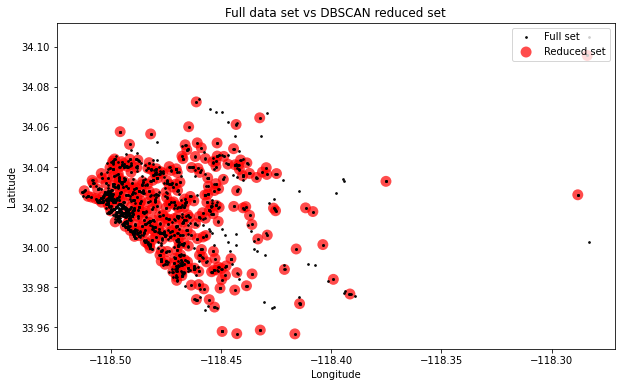

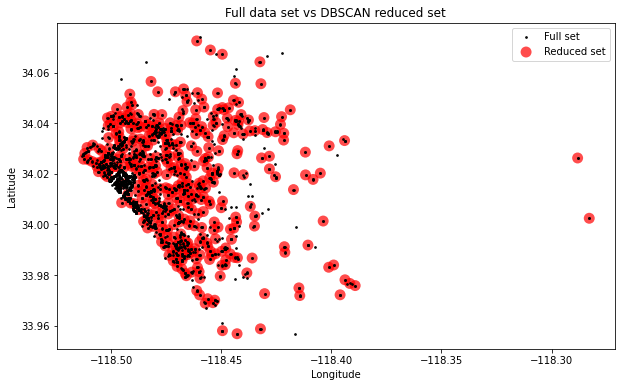

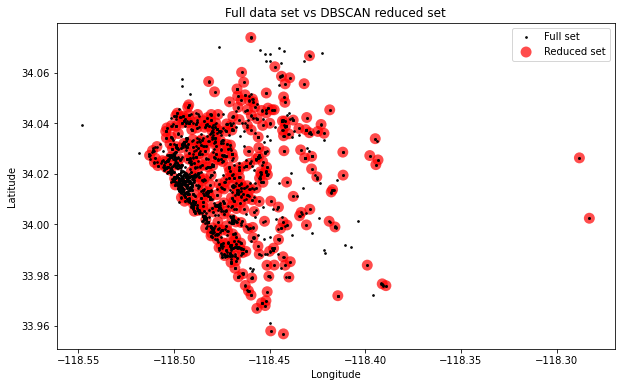

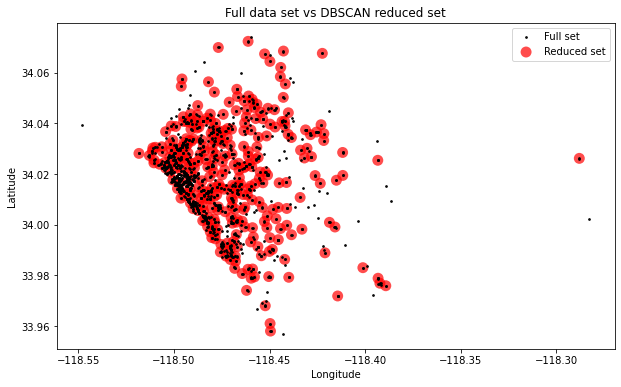

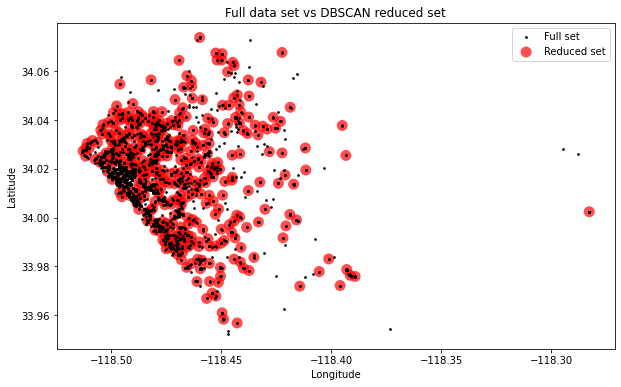

...

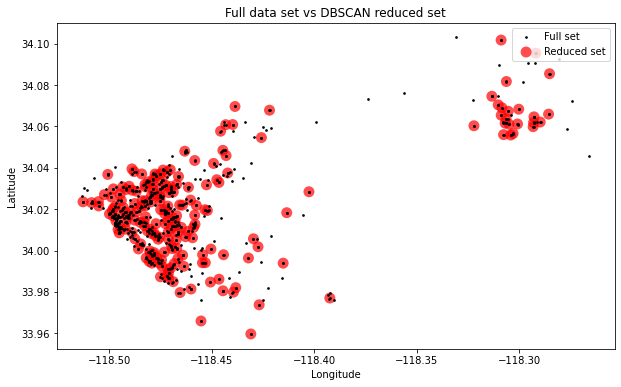

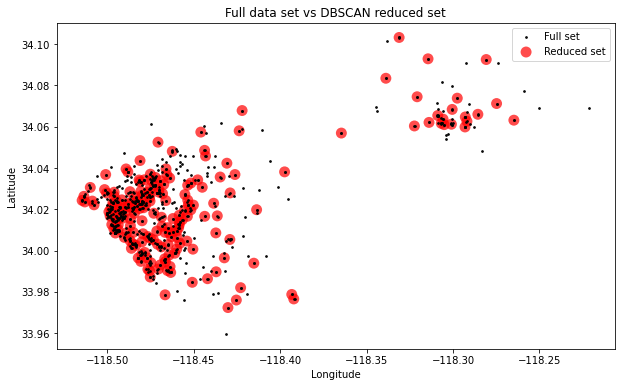

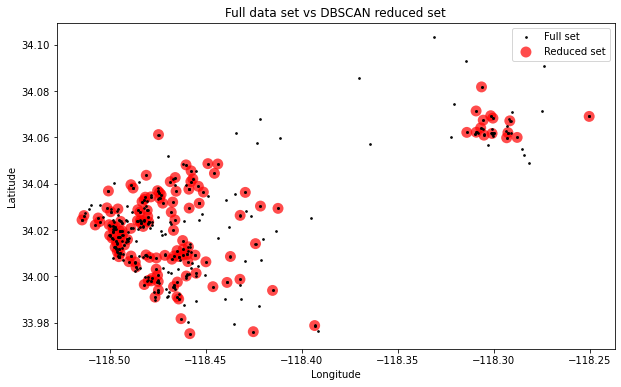

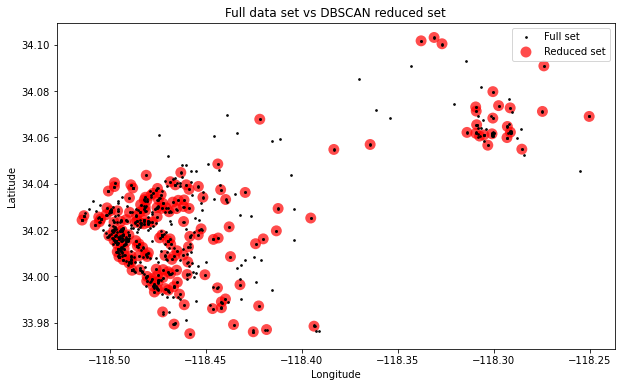

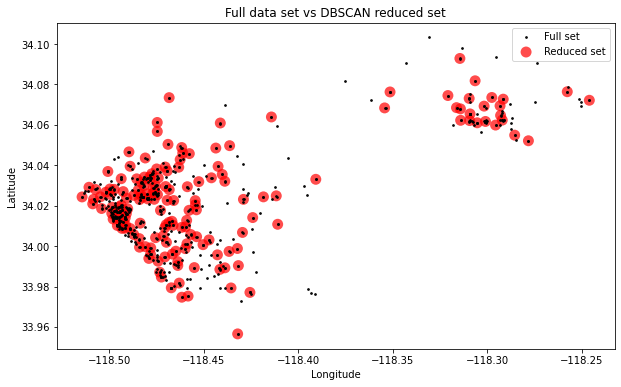

In [53]:
for i in days:
    if len( globals()['df{}'.format(i)])==0:
        print(i)
        continue

    fig, ax = plt.subplots(figsize=[10, 6])
    rs_scatter = ax.scatter(globals()['rs{}'.format(i)]['lon'], globals()['rs{}'.format(i)]['lat'], c='red', edgecolor='None', alpha=0.7, s=120)
    df_scatter = ax.scatter(globals()['df{}'.format(i)]['lon'], globals()['df{}'.format(i)]['lat'], c='k', alpha=0.9, s=3)
    ax.set_title('Full data set vs DBSCAN reduced set')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.legend([df_scatter, rs_scatter], ['Full set', 'Reduced set'], loc='upper right')
    plt.savefig('./LA_DBSCAN'+str(i)+'.png')


In [ ]:
for index in tqdm(days):
    if len(globals()['df{}'.format(index)])==0:
        continue
    checkmaker = -1
    cluster_labels = globals()['db{}'.format(index)].labels_

    globals()['solution{}'.format(index)]=[]

    for i in range(0,len( globals()['df{}'.format(index)])):

        minv = 3
        for j in range(0,len('centermost_points{}'.format(index))):
            t = globals()['centermost_points{}'.format(index)][j]
            m = globals()['dd{}'.format(index)].iloc[i]
            target = haversine(t[0],t[1],m[0],m[1])
            if(target == 0):

                checkmaker = j
                break
            if(target<minv and target >0):
                checkmaker = j
                minv = target
                if(minv<1 ):
                    checkmaker =j
                    break
            if( j == len( globals()['df{}'.format(index)]) and minv>0.5 ):
                checkmaker=-1
                break
        if cluster_labels[checkmaker]==-1 or cluster_labels[i] ==-1 or checkmaker == -1:
            #print("OPPPPS =  ", i)
            continue
        else:
            if i % 1000 == 0:
                print(i/1000)
            #print("we've got ", i, " these here, bro ", checkmaker, " and i'm " , (cluster_labels[i],cluster_labels[checkmaker]))
            globals()['solution{}'.format(index)].append([cluster_labels[i],cluster_labels[checkmaker]])

In [57]:
import networkx as nx

In [86]:
list_test=[0]*5
list_test[3]+=1
list_test

[0, 0, 0, 1, 0]

In [148]:
np.max(solution111),np.min(solution111)

(305, 0)

In [143]:
len(centermost_points111),len(list_in111),len(cnt_in111),len(solution111)

(306, 306, 1760, 1599)

In [149]:
for index in tqdm(days):
    if len(globals()['df{}'.format(index)])==0:
        
        continue
    globals()['list_in{}'.format(index)]= [0]*int(len(globals()['centermost_points{}'.format(index)]))
    globals()['list_out{}'.format(index)]= [0]*int(len(globals()['centermost_points{}'.format(index)]))

    for i in range(0,len(globals()['solution{}'.format(index)])):
        globals()['list_in{}'.format(index)][int(globals()['solution{}'.format(index)][i][1])]+=1
        globals()['list_out{}'.format(index)][int(globals()['solution{}'.format(index)][i][0])]+=1

    globals()['cnt_in{}'.format(index)] = np.empty(len(globals()['df{}'.format(index)]))
    globals()['cnt_out{}'.format(index)] = np.empty(len(globals()['df{}'.format(index)]))
    globals()['cnt_in{}'.format(index)].fill(0)
    globals()['cnt_out{}'.format(index)].fill(0)
    for i in range(0,len(globals()['centermost_points{}'.format(index)])):
        k = [globals()['list_in{}'.format(index)][i],globals()['list_out{}'.format(index)][i]]
        globals()['cnt_out{}'.format(index)][int(k[1])] += 1
        globals()['cnt_in{}'.format(index)][int(k[0])] += 1

100%|██████████| 192/192 [00:00<00:00, 366.02it/s]


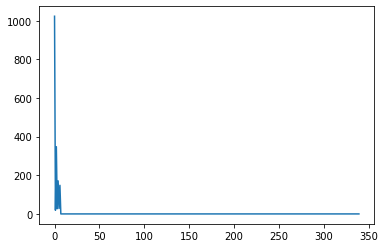

In [153]:
plt.plot(list_in113)

In [56]:
def node_strength(G, node, attribute):
    """
    Node strength is defined as the sum of the strengths (or weights) of all
    of the nodes edges.

    Parameters
    ----------
    G: graph
       A networkx graph
    node: object
       A node in the networkx graph
    attribute: object
       The edge attribute used to quantify node strength

    Returns
    -------
    node strength: (int, float)
    """
    output = 0.0
    for edge in G.edges(node):
        output += G.get_edge_data(*edge)[attribute]
    return output



In [ ]:
globals()['solution{}'.format(index)].append([cluster_labels[i],cluster_labels[checkmaker]])

In [117]:
globals()['centermost_points{}'.format(index)][0]


(34.01226, -118.49415)

In [120]:
strength=[]
for index in days:
    globals()['pos{}'.format(index)]={}

    if len(globals()['df{}'.format(index)])==0:
        strength.append(0)
        continue
    
    for j in range(0,len(globals()['centermost_points{}'.format(index)])):
        globals()['pos{}'.format(index)].update({j:[globals()['centermost_points{}'.format(index)][j][0],globals()['centermost_points{}'.format(index)][j][1]]})


In [121]:
pos112

{0: [34.01176666666667, -118.46162666666666],
 1: [34.03161166666667, -118.49613333333332],
 2: [34.01251166666667, -118.48288833333334],
 3: [34.02267666666667, -118.50399],
 4: [34.011786666666666, -118.47410166666668],
 5: [34.020095, -118.45197333333331],
 6: [34.008163333333336, -118.4896],
 7: [34.01775833333333, -118.40833666666668],
 8: [34.01597833333334, -118.494655],
 9: [34.051455, -118.49156666666669],
 10: [34.002115, -118.48383333333334],
 11: [34.03320333333333, -118.47469],
 12: [34.02296833333333, -118.49091666666666],
 13: [33.99921833333333, -118.48095666666669],
 14: [34.02280833333333, -118.49877333333332],
 15: [34.04017833333333, -118.49246666666669],
 16: [34.01489833333333, -118.48411166666666],
 17: [33.9962, -118.46839333333334],
 18: [34.012501666666665, -118.467095],
 19: [33.99876666666667, -118.45893166666669],
 20: [33.997825, -118.47442],
 21: [33.99612833333333, -118.47798166666666],
 22: [34.011925, -118.49250833333332],
 23: [34.004085, -118.4741],


In [152]:
for i in days:
    if len(globals()['df{}'.format(i)])==0:
        strength.append(0)
        continue
    G=nx.Graph()
    df_network = pd.DataFrame()
    df_network['in']=globals()['list_in{}'.format(i)]
    df_network['out']=globals()['list_out{}'.format(i)]

    df_network['weight'] = df_network.groupby(['in', 'out'])['in'].transform('size')
    G = nx.from_pandas_edgelist(df_network, 'in', 'out',
                            create_using=nx.DiGraph(),edge_attr='weight')
    G.remove_edges_from(nx.selfloop_edges(G))
    heat_r=[]
    for k in range(0,len(globals()['list_in{}'.format(i)])):
        
        heat_r.append( abs(globals()['list_in{}'.format(i)][k]-globals()['list_out{}'.format(i)][k]))
    heat=[]
    for j in range(len(list(G.nodes))):
        heat.append(100*heat_r[int(list(G.nodes)[j])])
    strength.append(node_strength(G,G.nodes,'weight'))
    plt.figure(figsize=(90,60))
    nx.draw(G,globals()['pos{}'.format(i)],node_size=heat)
    plt.savefig('hidbs{}.jpg'.format(i))
    plt.show()

IndexError: list index out of range

In [70]:
for index in tqdm(days):
    checkmaker = -1

#    len(globals()['list_in{}'.format(day)])
#    len(globals()['list_out{}'.format(day)])

    num_edge = 0

    for i in range(0,len( globals()['df{}'.format(index)])):
        minv = 3
        for j in range(0,len('centermost_points{}'.format(index))):
            t = globals()['centermost_points{}'.format(index)][j]
            m = globals()['dd{}'.format(index)].iloc[i]
            target = haversine(t[0],t[1],m[0],m[1])
            if(target == 0):

                checkmaker = j
                break
            if(target<minv and target >0):
                checkmaker = j
                minv = target
                if(minv<0.15):
                    checkmaker = j
                    break
        if cluster_labels[checkmaker]==-1:
            continue
#        len(globals()['list_in{}'.format(day)]).append(checkmaker)
#        len(globals()['list_out{}'.format(day)]).append()

    print("we've got ", checkmaker, " these here, bro ", cluster_labels[checkmaker], " and i'm " , (i,j))


            
             
        
        


  1%|          | 1/192 [00:00<02:54,  1.10it/s]

we've got  15  these here, bro  5  and i'm  (1759, 19)


  1%|          | 2/192 [00:02<03:46,  1.19s/it]

we've got  5  these here, bro  -1  and i'm  (2688, 19)


  2%|▏         | 3/192 [00:03<03:36,  1.14s/it]

we've got  11  these here, bro  -1  and i'm  (2118, 19)


  2%|▏         | 3/192 [00:03<04:04,  1.30s/it]


KeyboardInterrupt: 

  0%|          | 0/192 [00:00<?, ?it/s]

0.0
1.0


  1%|          | 1/192 [00:00<01:13,  2.61it/s]

1.0
2.0


  1%|          | 2/192 [00:00<01:33,  2.04it/s]

0.0
1.0


  2%|▏         | 3/192 [00:01<01:25,  2.21it/s]

2.0
0.0


  2%|▏         | 4/192 [00:01<01:15,  2.48it/s]

1.0
0.0
1.0


  3%|▎         | 5/192 [00:02<01:28,  2.12it/s]

2.0
0.0
1.0


  3%|▎         | 6/192 [00:02<01:30,  2.06it/s]

2.0
0.0


  4%|▎         | 7/192 [00:03<01:23,  2.21it/s]

1.0
0.0
1.0
2.0


  4%|▍         | 8/192 [00:03<01:29,  2.06it/s]

0.0
1.0


  5%|▍         | 9/192 [00:04<01:31,  1.99it/s]

2.0
0.0
1.0


  5%|▌         | 10/192 [00:04<01:42,  1.77it/s]

0.0
1.0


  6%|▌         | 11/192 [00:05<01:38,  1.84it/s]

2.0
0.0
1.0


  6%|▋         | 12/192 [00:05<01:35,  1.88it/s]

0.0
1.0


  7%|▋         | 13/192 [00:06<01:27,  2.04it/s]

0.0
1.0


  7%|▋         | 14/192 [00:06<01:29,  1.98it/s]

2.0
0.0
1.0


  8%|▊         | 15/192 [00:07<01:28,  1.99it/s]

2.0
0.0


  8%|▊         | 16/192 [00:07<01:21,  2.17it/s]

1.0
0.0
1.0
2.0


  9%|▉         | 17/192 [00:08<01:21,  2.16it/s]

0.0


  9%|▉         | 18/192 [00:08<01:22,  2.11it/s]

2.0
0.0


 10%|▉         | 19/192 [00:09<01:19,  2.17it/s]

1.0
0.0
1.0


 10%|█         | 20/192 [00:09<01:28,  1.93it/s]

2.0
0.0


 11%|█         | 21/192 [00:10<01:32,  1.86it/s]

0.0
1.0


 11%|█▏        | 22/192 [00:10<01:27,  1.94it/s]

2.0
0.0


 12%|█▏        | 23/192 [00:11<01:33,  1.82it/s]

2.0
0.0
1.0


 12%|█▎        | 24/192 [00:12<01:30,  1.85it/s]

2.0
0.0


 13%|█▎        | 25/192 [00:12<01:22,  2.02it/s]

1.0
0.0
1.0
2.0


 14%|█▎        | 26/192 [00:13<01:34,  1.76it/s]

3.0
0.0
1.0


 15%|█▍        | 28/192 [00:14<01:30,  1.81it/s]

1.0
2.0


 15%|█▌        | 29/192 [00:15<01:48,  1.50it/s]

0.0


 16%|█▌        | 30/192 [00:15<01:41,  1.59it/s]

2.0
0.0
1.0


 16%|█▌        | 31/192 [00:16<01:39,  1.62it/s]

0.0


 17%|█▋        | 32/192 [00:16<01:40,  1.59it/s]

2.0
0.0


 17%|█▋        | 33/192 [00:17<01:36,  1.65it/s]

2.0
0.0


 18%|█▊        | 34/192 [00:17<01:24,  1.87it/s]

1.0
0.0
1.0


 18%|█▊        | 35/192 [00:18<01:26,  1.81it/s]

0.0
1.0


 19%|█▉        | 36/192 [00:18<01:23,  1.86it/s]

2.0
0.0


 19%|█▉        | 37/192 [00:19<01:16,  2.02it/s]

1.0
0.0
1.0


 20%|█▉        | 38/192 [00:19<01:21,  1.90it/s]

2.0
0.0
1.0


 20%|██        | 39/192 [00:20<01:20,  1.90it/s]

2.0
0.0


 21%|██        | 40/192 [00:20<01:16,  1.98it/s]

1.0
0.0
1.0


 21%|██▏       | 41/192 [00:21<01:18,  1.91it/s]

2.0
0.0
1.0


 22%|██▏       | 42/192 [00:22<01:23,  1.79it/s]

2.0


 22%|██▏       | 43/192 [00:22<01:18,  1.89it/s]

0.0
1.0
2.0


 23%|██▎       | 44/192 [00:23<01:21,  1.81it/s]

0.0
1.0


 23%|██▎       | 45/192 [00:23<01:17,  1.89it/s]

0.0
1.0


 24%|██▍       | 46/192 [00:24<01:10,  2.06it/s]

0.0
1.0


 24%|██▍       | 47/192 [00:24<01:19,  1.81it/s]

0.0
1.0


 25%|██▌       | 48/192 [00:25<01:20,  1.79it/s]

2.0
0.0


 26%|██▌       | 49/192 [00:25<01:13,  1.94it/s]

0.0
1.0


 26%|██▌       | 50/192 [00:26<01:18,  1.80it/s]

2.0
0.0
1.0


 27%|██▋       | 51/192 [00:26<01:16,  1.83it/s]

2.0
0.0


 27%|██▋       | 52/192 [00:27<01:09,  2.00it/s]

1.0
0.0
1.0


 28%|██▊       | 53/192 [00:27<01:11,  1.95it/s]

2.0
0.0
1.0


 28%|██▊       | 54/192 [00:28<01:10,  1.96it/s]

0.0
1.0


 29%|██▊       | 55/192 [00:28<01:03,  2.15it/s]

0.0
1.0


 29%|██▉       | 56/192 [00:29<01:07,  2.01it/s]

2.0
0.0
1.0


 30%|██▉       | 57/192 [00:29<01:08,  1.97it/s]

0.0
1.0


 30%|███       | 58/192 [00:30<01:03,  2.10it/s]

0.0
1.0


 31%|███       | 59/192 [00:30<01:08,  1.95it/s]

2.0
0.0
1.0


 31%|███▏      | 60/192 [00:31<01:06,  1.99it/s]

2.0
0.0


 32%|███▏      | 61/192 [00:31<01:00,  2.18it/s]

1.0
0.0
1.0


 32%|███▏      | 62/192 [00:32<01:02,  2.07it/s]

2.0
0.0
1.0


 33%|███▎      | 63/192 [00:32<01:01,  2.10it/s]

0.0


 33%|███▎      | 64/192 [00:33<00:58,  2.18it/s]

0.0
1.0


 34%|███▍      | 65/192 [00:33<01:04,  1.97it/s]

2.0
0.0


 34%|███▍      | 66/192 [00:34<01:01,  2.04it/s]

0.0
1.0


 35%|███▍      | 67/192 [00:34<00:54,  2.28it/s]

0.0
1.0


 35%|███▌      | 68/192 [00:35<00:57,  2.15it/s]

2.0
0.0


 36%|███▌      | 69/192 [00:35<00:53,  2.28it/s]

0.0
1.0


 36%|███▋      | 70/192 [00:35<00:48,  2.51it/s]

0.0
1.0


 38%|███▊      | 72/192 [00:36<00:48,  2.50it/s]

1.0


 38%|███▊      | 73/192 [00:36<00:42,  2.82it/s]

0.0
1.0


 39%|███▊      | 74/192 [00:37<00:44,  2.67it/s]

0.0
1.0


 39%|███▉      | 75/192 [00:37<00:41,  2.80it/s]

0.0
1.0


 40%|███▉      | 76/192 [00:37<00:39,  2.91it/s]

0.0
1.0


 40%|████      | 77/192 [00:38<00:42,  2.71it/s]

0.0
1.0


 41%|████      | 78/192 [00:38<00:42,  2.69it/s]

0.0
1.0


 41%|████      | 79/192 [00:38<00:40,  2.82it/s]

0.0
1.0


 42%|████▏     | 80/192 [00:39<00:49,  2.28it/s]

2.0
0.0
1.0


 42%|████▏     | 81/192 [00:40<00:49,  2.25it/s]

0.0
1.0


 43%|████▎     | 82/192 [00:40<00:46,  2.39it/s]

0.0
1.0


 43%|████▎     | 83/192 [00:40<00:50,  2.15it/s]

2.0
0.0
1.0


 44%|████▍     | 84/192 [00:41<00:53,  2.01it/s]

2.0
0.0


 44%|████▍     | 85/192 [00:41<00:51,  2.09it/s]

0.0
1.0


 45%|████▍     | 86/192 [00:42<00:56,  1.88it/s]

1.0


 45%|████▌     | 87/192 [00:43<00:54,  1.93it/s]

0.0


 46%|████▌     | 88/192 [00:43<00:51,  2.00it/s]

1.0
0.0


 46%|████▋     | 89/192 [00:44<00:53,  1.91it/s]

2.0
0.0
1.0


 47%|████▋     | 90/192 [00:44<00:54,  1.88it/s]

2.0


 47%|████▋     | 91/192 [00:45<00:48,  2.07it/s]

0.0
1.0


 48%|████▊     | 92/192 [00:45<00:54,  1.83it/s]

0.0
1.0


 48%|████▊     | 93/192 [00:46<00:54,  1.81it/s]

2.0
0.0


 49%|████▉     | 94/192 [00:46<00:48,  2.02it/s]

1.0
0.0
1.0
2.0


 49%|████▉     | 95/192 [00:47<00:46,  2.09it/s]

0.0
1.0


 50%|█████     | 96/192 [00:47<00:44,  2.18it/s]

0.0


 51%|█████     | 97/192 [00:47<00:39,  2.39it/s]

0.0
1.0


 51%|█████     | 98/192 [00:48<00:40,  2.34it/s]

2.0


 52%|█████▏    | 99/192 [00:48<00:38,  2.42it/s]

1.0
0.0


 52%|█████▏    | 100/192 [00:49<00:34,  2.65it/s]

1.0
0.0
1.0


 53%|█████▎    | 101/192 [00:49<00:37,  2.44it/s]

2.0
0.0


 53%|█████▎    | 102/192 [00:49<00:38,  2.35it/s]

0.0
1.0


 54%|█████▎    | 103/192 [00:50<00:35,  2.48it/s]

0.0
1.0


 54%|█████▍    | 104/192 [00:50<00:37,  2.35it/s]

2.0
0.0


 55%|█████▍    | 105/192 [00:51<00:35,  2.43it/s]

0.0
1.0


 55%|█████▌    | 106/192 [00:51<00:33,  2.54it/s]

0.0
1.0


 56%|█████▌    | 107/192 [00:51<00:35,  2.40it/s]

2.0
0.0


 56%|█████▋    | 108/192 [00:52<00:34,  2.43it/s]

1.0
0.0


 57%|█████▋    | 109/192 [00:52<00:31,  2.64it/s]

1.0
0.0
1.0
2.0


 57%|█████▋    | 110/192 [00:53<00:34,  2.41it/s]

0.0


 58%|█████▊    | 111/192 [00:53<00:35,  2.27it/s]

1.0
0.0


 58%|█████▊    | 112/192 [00:54<00:35,  2.26it/s]

1.0
0.0
1.0
2.0


 59%|█████▉    | 113/192 [00:54<00:35,  2.25it/s]

0.0


 59%|█████▉    | 114/192 [00:55<00:34,  2.27it/s]

2.0
0.0
1.0


 60%|█████▉    | 115/192 [00:55<00:30,  2.51it/s]

0.0
1.0


 60%|██████    | 116/192 [00:55<00:31,  2.43it/s]

2.0
0.0


 61%|██████    | 117/192 [00:56<00:29,  2.52it/s]

0.0
1.0


 61%|██████▏   | 118/192 [00:56<00:29,  2.54it/s]

0.0
1.0


 62%|██████▏   | 119/192 [00:57<00:32,  2.26it/s]

2.0
0.0
1.0


 62%|██████▎   | 120/192 [00:57<00:31,  2.28it/s]

0.0
1.0


 63%|██████▎   | 121/192 [00:57<00:28,  2.46it/s]

0.0
1.0


 64%|██████▎   | 122/192 [00:58<00:31,  2.21it/s]

2.0
0.0
1.0


 64%|██████▍   | 123/192 [00:58<00:32,  2.15it/s]

2.0
0.0


 65%|██████▍   | 124/192 [00:59<00:30,  2.26it/s]

1.0
0.0
1.0


 65%|██████▌   | 125/192 [00:59<00:32,  2.05it/s]

2.0
0.0
1.0


 66%|██████▌   | 126/192 [01:00<00:31,  2.09it/s]

2.0
0.0


 66%|██████▌   | 127/192 [01:00<00:29,  2.18it/s]

1.0
0.0
1.0


 67%|██████▋   | 128/192 [01:01<00:32,  1.98it/s]

2.0
0.0


 67%|██████▋   | 129/192 [01:01<00:31,  2.00it/s]

0.0


 68%|██████▊   | 130/192 [01:02<00:29,  2.09it/s]

1.0
0.0
1.0


 68%|██████▊   | 131/192 [01:02<00:31,  1.92it/s]

2.0
1.0


 69%|██████▉   | 132/192 [01:03<00:30,  1.98it/s]

2.0
0.0


 69%|██████▉   | 133/192 [01:03<00:28,  2.10it/s]

1.0


 74%|███████▍  | 143/192 [01:04<00:04, 10.36it/s]

0.0
0.0


 76%|███████▌  | 145/192 [01:04<00:05,  8.26it/s]

0.0
0.0
1.0
0.0


 77%|███████▋  | 147/192 [01:05<00:07,  6.19it/s]

0.0
0.0


 78%|███████▊  | 150/192 [01:05<00:07,  5.71it/s]

0.0
0.0


 79%|███████▉  | 152/192 [01:06<00:07,  5.59it/s]

0.0
0.0


 80%|████████  | 154/192 [01:06<00:06,  5.79it/s]

0.0
0.0


 81%|████████  | 155/192 [01:06<00:07,  5.24it/s]

1.0


 82%|████████▏ | 157/192 [01:07<00:06,  5.63it/s]

0.0


 83%|████████▎ | 159/192 [01:07<00:05,  5.59it/s]

1.0
0.0


 84%|████████▍ | 161/192 [01:07<00:05,  5.69it/s]

0.0
0.0


 85%|████████▍ | 163/192 [01:08<00:04,  6.17it/s]

0.0


 86%|████████▌ | 165/192 [01:08<00:05,  5.16it/s]

0.0
0.0


 87%|████████▋ | 167/192 [01:08<00:05,  4.92it/s]

0.0
1.0
0.0


 88%|████████▊ | 169/192 [01:09<00:04,  5.43it/s]

0.0
0.0


 89%|████████▊ | 170/192 [01:09<00:04,  4.93it/s]

1.0
0.0


 91%|█████████ | 174/192 [01:10<00:04,  4.21it/s]

0.0
0.0


 91%|█████████ | 175/192 [01:10<00:03,  4.70it/s]

0.0


 92%|█████████▏| 177/192 [01:11<00:03,  4.57it/s]

0.0


 93%|█████████▎| 178/192 [01:11<00:02,  4.93it/s]

0.0


 93%|█████████▎| 179/192 [01:11<00:02,  4.45it/s]

1.0
0.0


 94%|█████████▍| 181/192 [01:11<00:02,  4.86it/s]

0.0
0.0


 95%|█████████▌| 183/192 [01:12<00:01,  4.71it/s]

0.0
0.0


 97%|█████████▋| 186/192 [01:12<00:01,  5.06it/s]

0.0


 98%|█████████▊| 188/192 [01:13<00:00,  5.29it/s]

0.0


100%|██████████| 192/192 [01:14<00:00,  2.59it/s]
